# 1) Percolación

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
plt.rcParams['font.size'] = '16'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Tahoma']
plt.rc('mathtext', fontset='stix')
#plt.rc('text',usetex = True)

In [3]:
L = int(input('¿longitud del lado?  '))

In [4]:
p = float(input('¿fracción de ocupación?  '))

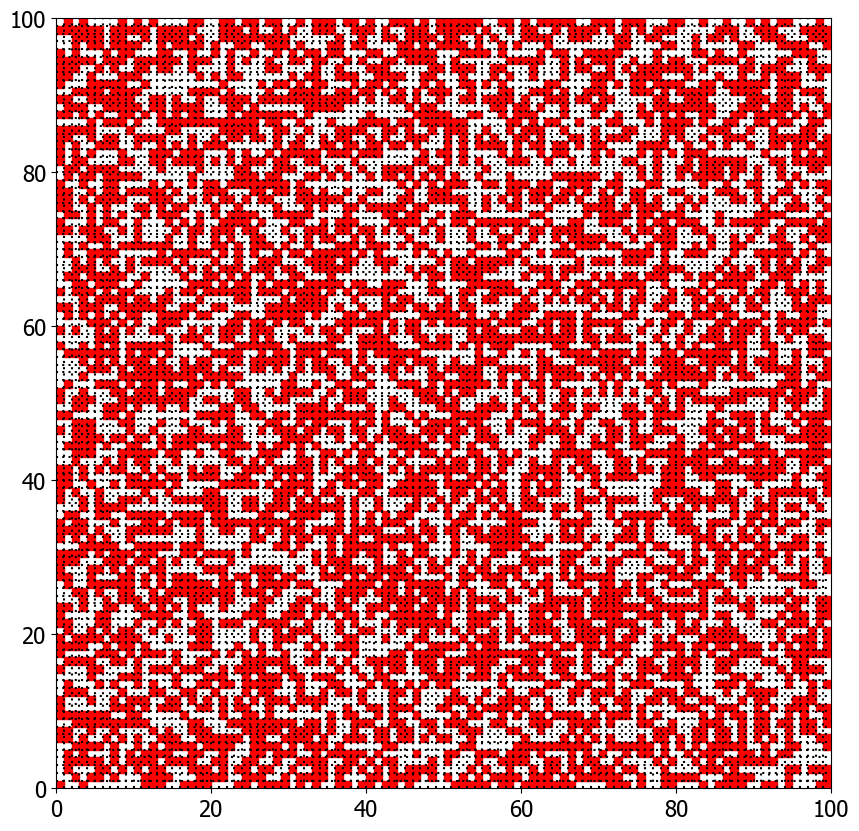

In [5]:
N = L*L

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim(0,L)
ax.set_ylim(0,L)
for i in range(L):
    for j in range(L):
        if np.random.random() < p:
            rect = plt.Rectangle((i, j), 1, 1, color='r')
            ax.add_patch(rect)
for i in range(1,L):
    ax.axhline(i,color='black',dashes=(1, 2),zorder=1)
    ax.axvline(i,color='black',dashes=(1, 2),zorder=1)
plt.show()

# ¿Qué nos interesa?

En principio, determinar si un aglomerado coneta los extremos de la red.

## A. El algoritmo de Newmann y Ziff

### Preliminares

In [6]:
import numpy as np
import random

#### a) Bosquejo del programa principal. Inicialización.

In [7]:
global L, N, empty, parent, nn, order

L=4
N=L**2 #Número total de sitios
empty=-(N+1)

#parent=np.zeros(N, dtype=int)               # array of pointers
parent = empty*np.ones(N,dtype=int)
nn=np.zeros((N, 4), dtype=int)           # nearest neighbors
#order=np.zeros(N, dtype=int)             # occupation number

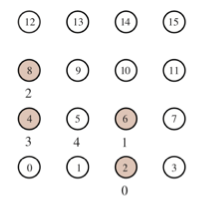

In [8]:
from IPython.display import Image
Image("EsquemaNZ.png", width=300, height=300)

#### b) Establecer el orden de ocupación

#### LLenar order[]

In [9]:
def permutation():
    global order,N
    order = np.random.permutation(N)

In [10]:
permutation()
print(order)

[ 8 11 13 10  2  6  1 14  5  9 12 15  0  3  7  4]


Si $i$ es el índice con que recorro el arreglo **order**, la fracción de ocupación viene dada por:

\begin{equation}
p = \frac{i+1}{N}
\end{equation}

#### c) Establecer los vecinos de cada sitio
#### LLenar nn[s,j]

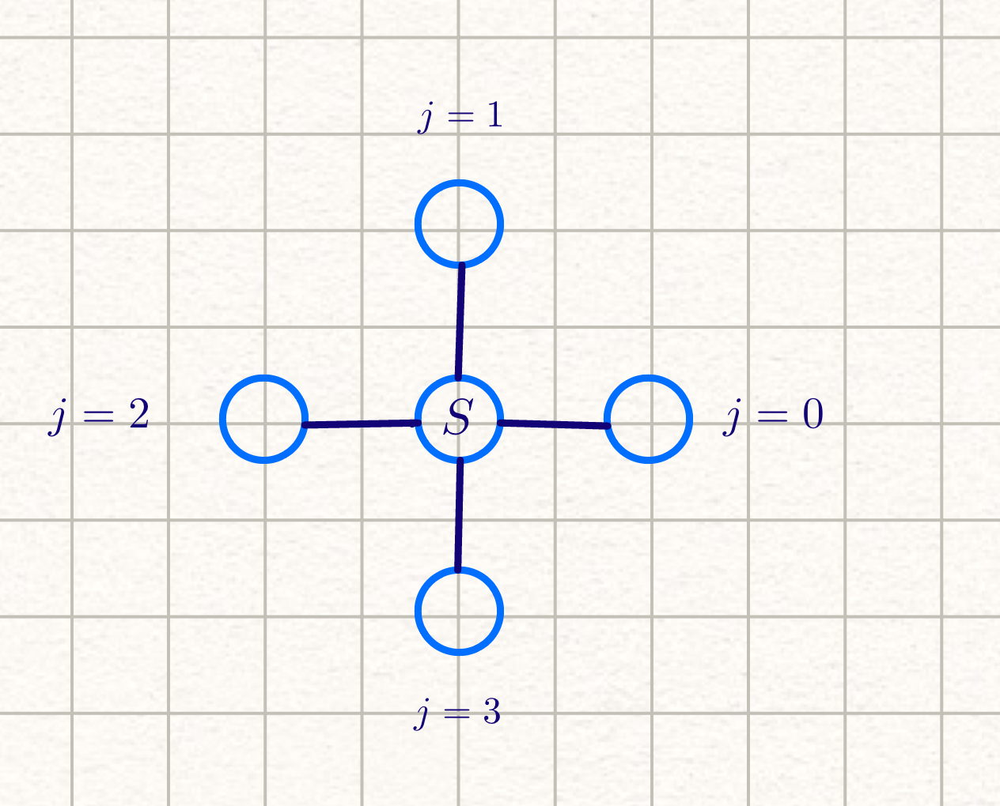

In [11]:
Image("sj.png", width=300, height=300)

In [12]:
# Setting the boundaries no PBC utilizando case, no hay vecino EMPTY
def vecino(s,j):
    global L,empty
    
    if j == 0: #derecha
        if s%L == L-1:
            return empty
        else:
            return s+1
    elif j==1: #arriba
        if s//L == L-1:
            return empty
        else:
            return s+L
    elif j==2: #izquierda
        if s%L == 0:
            return empty
        else:
            return s-1
    elif j==3: #abajo
        if s//L == 0:
            return empty
        else:
            return s-L
                
def boundaries():
    global N,nn
    for s in range(N):
        for j in range(4):
            nn[s,j] = vecino(s,j)

In [13]:
boundaries()
print(nn[14])
nn[14,3]

[ 15 -17  13  10]


10

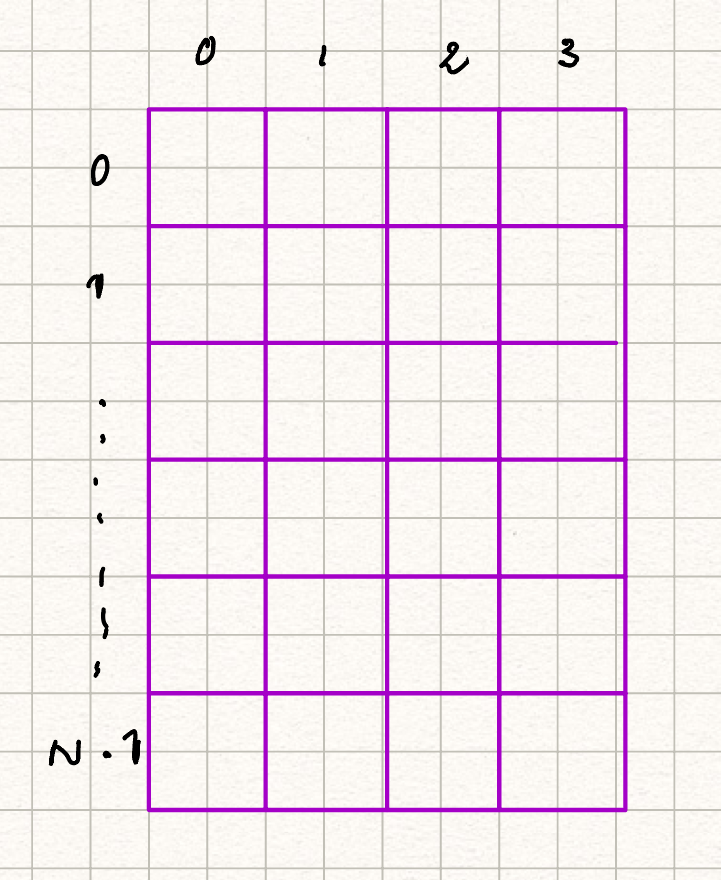

In [14]:
Image("nn.png", width=300, height=300)

#### d) Determinación de  los clusters

#### Utilización y manipulación del array parent

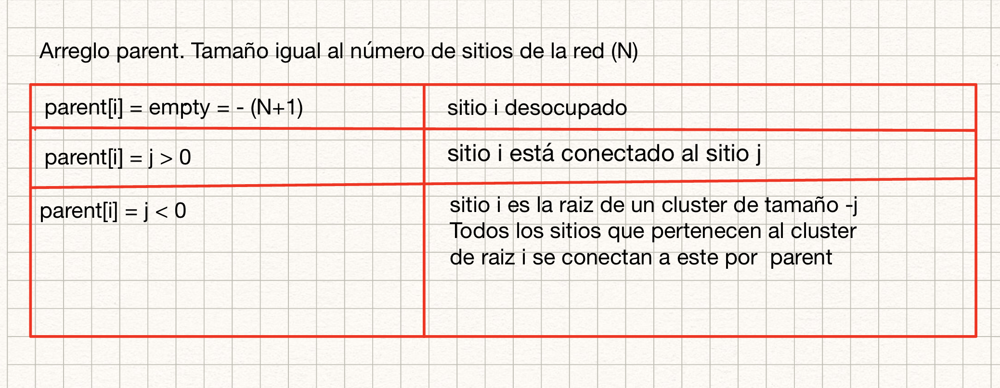

In [15]:
Image("Arregloparent.png", width=600, height=600)

# Encontrar la raiz

In [16]:
# Find operation de la raiz, versión no recursiva, no se cambian los ptr.
def findroot(r):
    global parent
    while parent[r] >= 0:
        r = parent[r]
    return r

####  Unir dos clusters

In [17]:
#union de raíces (clusters), version no recursiva
def mergeroots(r1,r2):
    global parent
    if r1 == r2: #Pertenecen al mismo cluster
        return r1
    elif -parent[r1] > -parent[r2]: #Cluster 1 > Cluster 2. La raiz pasa a ser la de 1 
        parent[r1] += parent[r2]
        parent[r2] = r1
        return r1
    else:
        parent[r2] += parent[r1] #Cluster 2 > Cluster 1. La raiz pasa a ser la de 2
        parent[r1] = r2
        return r2       

#### e)  El algoritmo de percolación

In [18]:
def percolate():
    global order, N, parent, nn, empty
    BIG = []
    big=0
    
#    for i in range(N): parent[i]=empty
    #parent = empty*np.ones(N)
    
    for i in range(N):
        r1=s1=order[i]  #Es a la vez sitio y raiz
        parent[s1] = -1  #El tamño del cluster es 1
                
        for j in range(4):
            s2=nn[s1, j]
            if s2 != empty:  #El sitio no es vacío
                if parent[s2] != empty: #El sitio pertenece a un cluster
                    r1 = mergeroots(r1,findroot(s2)) #nueva raiz del sitio s
                    if -parent[r1]>big: big=-parent[r1] #ve si el cluster es más grande que big
        BIG.append(big)

    return np.array(BIG)

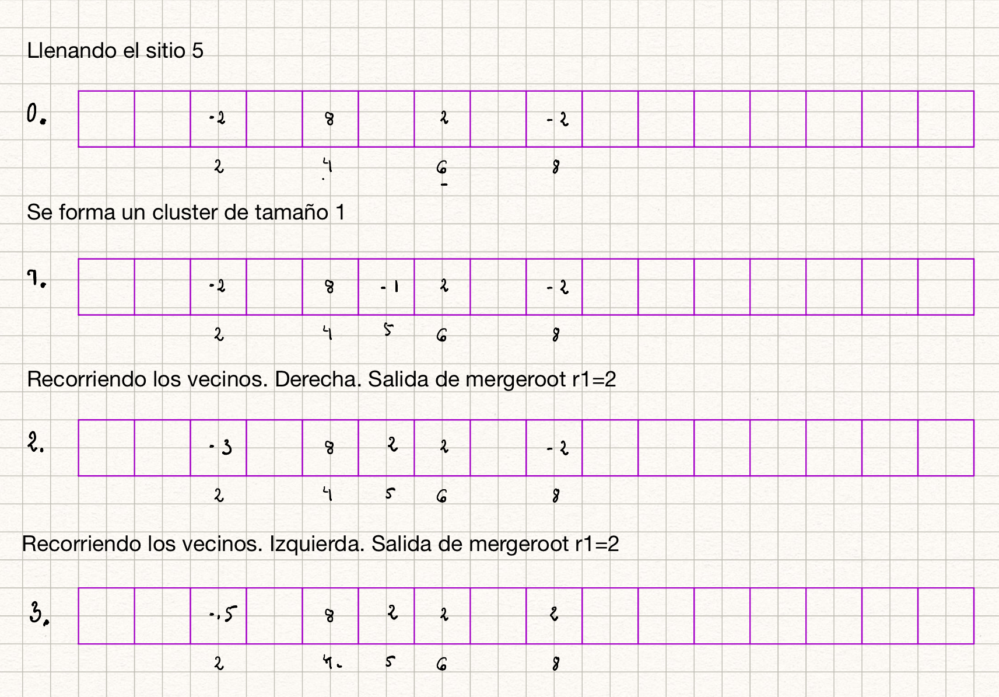

In [19]:
Image("Corridaenfrio.png", width=600, height=600)

#### Corrida

In [20]:
import numpy as np
import random
import matplotlib.pyplot as plt

In [21]:
plt.rcParams['font.size'] = '16'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Tahoma']
#plt.rc('text',usetex = True)
plt.rc('mathtext', fontset='stix')

In [22]:
#Datos, inicalizaciones  y corridas

global L, N, empty, parent, nn, order

L = 1024
N = L**2
#order=np.zeros(N, dtype=int) 
empty=-(N+1)
#parent=np.zeros(N, dtype=int)               # array of pointers
parent = empty*np.ones(N,dtype = 'int')
nn=np.zeros((N, 4), dtype=int)           # nearest neighbors

permutation()
boundaries()
BIG = percolate()

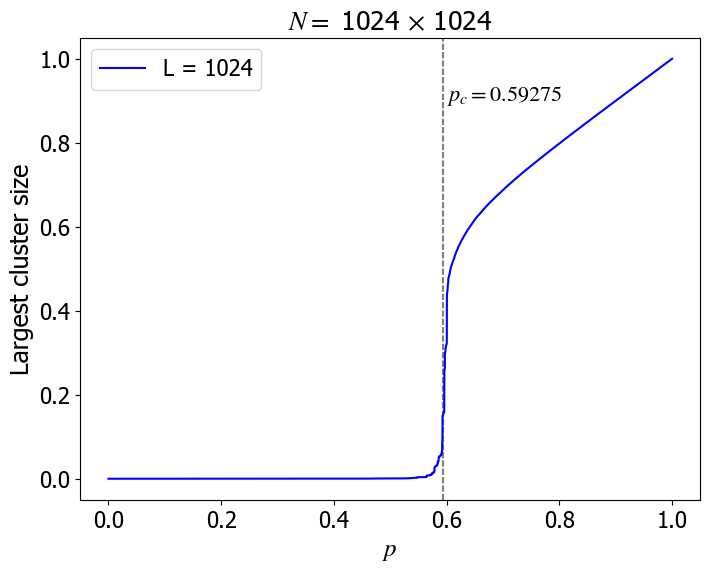

In [23]:
p = np.array(range(1,N+1))/N
plt.figure(figsize=(8,6))
BIG = BIG/N
plt.plot(p, BIG, 'b-',label = "L = {}".format(L))
plt.xlabel(r"$p$",fontsize = 18)
plt.ylabel("Largest cluster size",fontsize = 18)
plt.title(r"$N = $ {} $\times$ {}".format(L,L))
plt.axvline(0.59275,color = "gray",zorder=-1,dashes = (3,1))
plt.text(0.6,0.9*BIG.max(),r'$p_c = 0.59275$')
plt.legend(loc = 'best')

## El aglomerado expandido y la probabilidad de percolación

In [24]:
import numpy as np
import matplotlib.pyplot as plt

Se utilizan dos array que me dicen:

**touchesLeft[r]**: si el cluster cuya raiz es r toca el extremo izquierdo será igual a True, en caso contrario será False.

**touchesRight[r]**: si el cluster cuya raiz es r toca el extremo derecho será igual a True, en caso contrario será False.

Lo explicaremos vía touchesLeft. Esta es la incialización de touchesLeft.

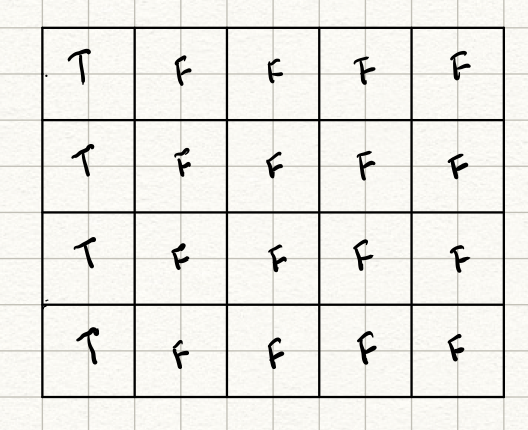

In [25]:
from IPython.display import Image
Image("touchesLeft1.png", width=300, height=300)

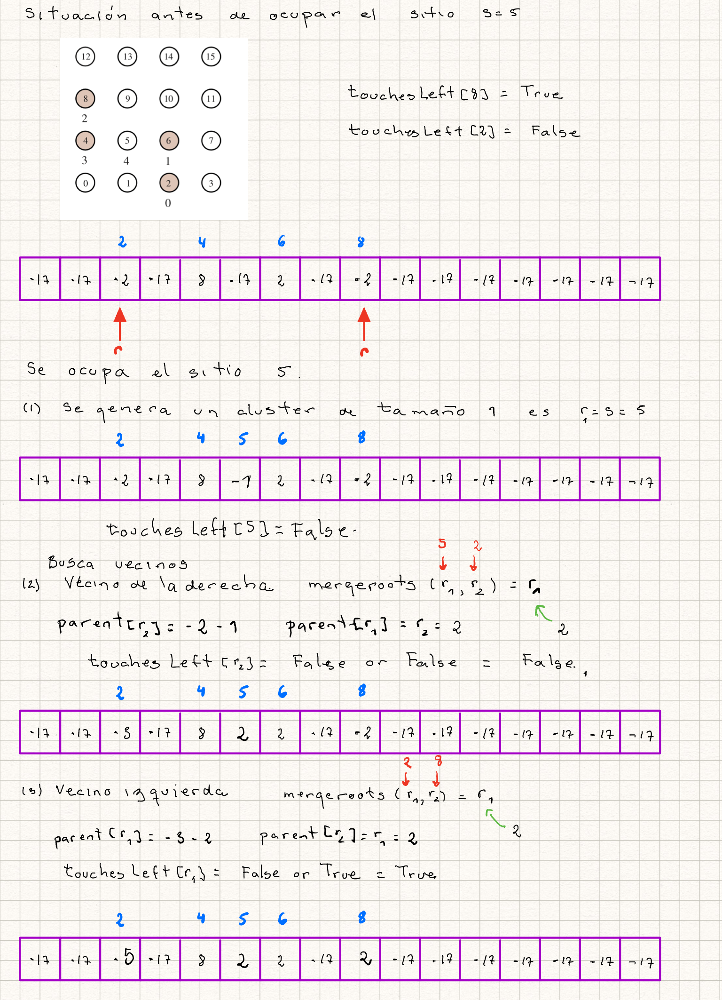

In [26]:
Image("ClaseTouchesLeft.png", width=800)

#### Rutinas similares a la anterior

In [27]:
def permutation():
    global order,N
    order = np.random.permutation(N)

# Setting the boundaries no PBC utilizando case, no hay vecino EMPTY
def vecino(s,j):
    global L,empty
    
    if j == 0: #izquierda
        if s%L ==0:
            return empty
        else:
            return s-1
    elif j==1: #derecha
        if s%L == L-1:
            return empty
        else:
            return s+1
    elif j==2: #abajo
        if s//L == 0:
            return empty
        else:
            return s-L
    elif j==3: #arriba
        if s//L == L-1:
            return empty
        else:
            return s+L
                
def boundaries():
    global N,nn
    for s in range(N):
        for j in range(4):
            nn[s,j] = vecino(s,j)

# Find operation de la raiz, versión no recursiva, no se cambian los ptr.
def findroot(r):
    global parent
    while parent[r] >= 0:
        r = parent[r]
    return r

#### f)  Funciones con cambio para la determinación del aglomerado percolativo

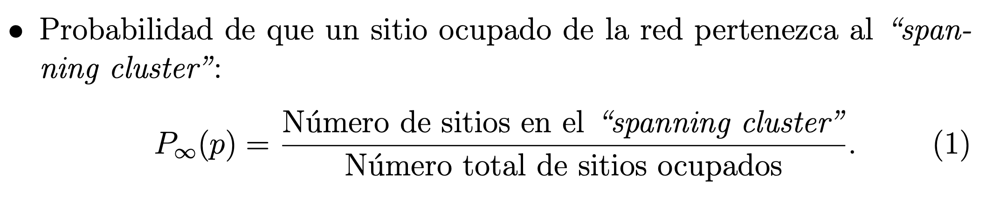

In [28]:
Image("ParametrodeOrden.png", width=600)

In [29]:
#union de raíces (clusters), version no recursiva
def mergeroots(r1,r2):
    global spanclussize,parent,touchesLeft,touchesRight
    if r1 == r2:
        return r1
    elif -parent[r1] > -parent[r2]:
        parent[r1] += parent[r2]
        parent[r2] = r1
        #si alguno de los dos toca a la izquierda el compuesto tocará
        touchesLeft[r1] = touchesLeft[r1] or touchesLeft[r2] 
        #si alguno de los dos toca a la derecha  el compuesto tocará
        touchesRight[r1] = touchesRight[r1] or touchesRight[r2]
        if touchesLeft[r1] and touchesRight[r1]:
            #si el cluster toca a la izquierda y a la derecha existirá aglomerado expnadido
            spanclussize = -parent[r1]
        return r1 
    else:
        parent[r2] += parent[r1]
        parent[r1] = r2
        #si alguno de los dos toca a la izquierda el compuesto tocará
        touchesLeft[r2] = touchesLeft[r2] or touchesLeft[r1]
        #si alguno de los dos toca a la derecha  el compuesto tocará
        touchesRight[r2] = touchesRight[r2] or touchesRight[r1]
        if touchesLeft[r2] and touchesRight[r2]:
            #si el cluster toca a la izquierda y a la derecha existirá aglomerado expnadido
            spanclussize = -parent[r2]
        return r2        

In [30]:
def percolate():
    global spanclussize,order,parent,nn
    BIG = []
    PSpan = []
    big=0
    spanclussize = 0
    
#    for i in range(N): parent[i]=empty    

    for i in range(N):
        r1=s1=order[i]
        parent[s1] = -1
                
        for j in range(4):
            s2=nn[s1, j]
            if s2 != empty:
                if parent[s2] != empty:
                    r1 = mergeroots(r1,findroot(s2))
                    if -parent[r1]>big: big=-parent[r1]
        BIG.append(big)
        PSpan.append(spanclussize/(i+1.))

    return np.array(BIG), np.array(PSpan)

In [31]:
#Datos, inicalizaciones  y corridas
global L, N, empty, parent, nn, order, spanclussize,touchesLeft,touchesRight

L = 1024
N = L**2

#order=np.zeros(N, dtype=int) 
empty=-(N+1)
parent = empty*np.ones(N,dtype = int)
#parent=np.zeros(N, dtype=int)               # array of pointers
nn=np.zeros((N, 4), dtype=int)           # nearest neighbors
touchesLeft =  [i%L == 0 for i in range(N)]
touchesRight = [i%L == L-1 for i in range(N)]

permutation()
boundaries()

BIG, PSpan = percolate()

Prob = np.copy(PSpan) #mejorarlo
Prob[PSpan > 0]= 1


In [32]:
plt.rcParams['font.size'] = '16'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Tahoma']
plt.rc('mathtext', fontset='stix')
#plt.rc('text',usetex = True)

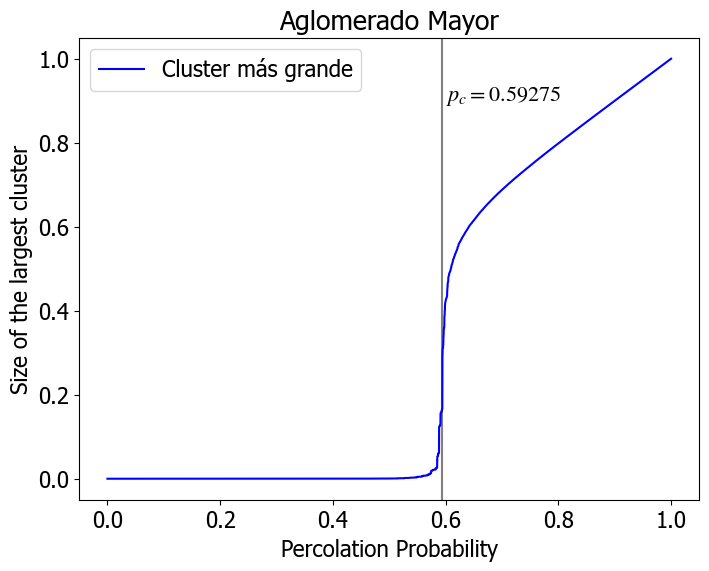

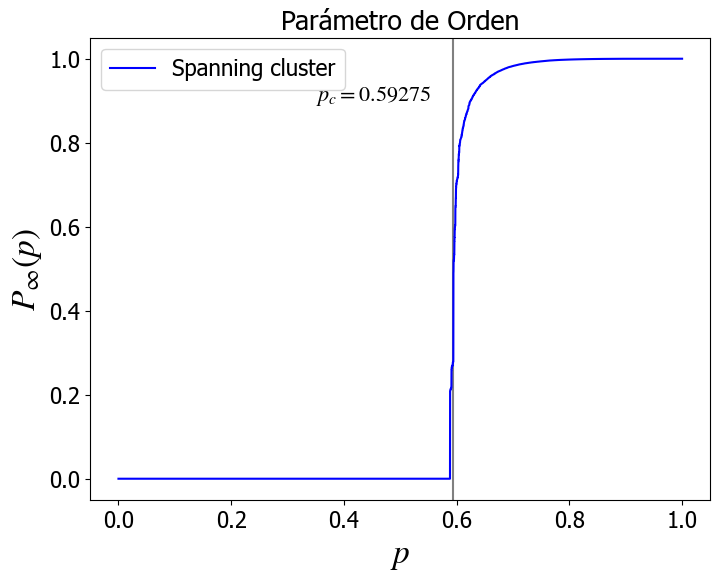

In [33]:
plt.figure(figsize=(8,6))
p = np.array(range(1,N+1))/N
BIG = BIG/N
plt.plot(p, BIG, 'b-',label = "Cluster más grande")
plt.xlabel("Percolation Probability")
plt.ylabel("Size of the largest cluster")
plt.title("Aglomerado Mayor")
plt.axvline(0.59275,color = "gray",zorder=-1)
plt.text(0.6,0.9*BIG.max(),r'$p_c = 0.59275$')
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(p, PSpan, 'b-',label = "Spanning cluster")
plt.xlabel(r"$p$",fontsize = 24)
plt.ylabel(r'$P_\infty(p)$',fontsize = 24)
plt.title("Parámetro de Orden")
plt.axvline(0.59275,color = "gray",zorder=-1)
plt.text(0.35,0.9,r'$p_c = 0.59275$')
plt.legend()
plt.show()

## Distribución de tamaño de aglomerado $n_s$ y tamaño promedio de aglomerado $S$.

### Definiciones:

In [34]:
Image("nsyS.png", width=600)

FileNotFoundError: No such file or directory: 'nsyS.png'

FileNotFoundError: No such file or directory: 'nsyS.png'

<IPython.core.display.Image object>

### ¿Cuál es la mejor manera de obtenerlas?

Se podrían obtener para cada fracción de ocupación $p$ a partir del array parent. Sin embargo lo mejor es aprovechar la dinámica del algortimo de Newmann-Ziff. $n_s$ y $S$ para un valor de $p$ es una pequeña variación de la misma cantidad para un $p$ anterior.

In [35]:
import numpy as np
import matplotlib.pyplot as plt

### Rutinas que  no cambian

In [36]:
def permutation():
    global order,N
    order = np.random.permutation(N)

# Setting the boundaries no PBC utilizando case, no hay vecino EMPTY
def vecino(s,j):
    global L,empty
    
    if j == 0: #izquierda
        if s%L ==0:
            return empty
        else:
            return s-1
    elif j==1: #derecha
        if s%L == L-1:
            return empty
        else:
            return s+1
    elif j==2: #abajo
        if s//L == 0:
            return empty
        else:
            return s-L
    elif j==3: #arriba
        if s//L == L-1:
            return empty
        else:
            return s+L
                
def boundaries():
    global N,nn
    for s in range(N):
        for j in range(4):
            nn[s,j] = vecino(s,j)

# Find operation de la raiz, versión no recursiva, no se cambian los ptr.
def findroot(r):
    global parent
    while parent[r] >= 0:
        r = parent[r]
    return r

### Rutinas nuevas

1. Se agrega una nueva variable global, array ns de tamaño $N$+1. El índice $s$ representa el tamaño de aglomerado y el ns[s]  representa el número de aglomerados de tamaño s.

2. Incrementaremos y decrementaresmo ns dependiendo de los aglomerados que aparezcan y los que desaparezcan.

* En la función percolate al agregar un nuevo sitio se genera un cluster de tamaño 1 por lo tanta ns[1] = ns[1]+1

* En la función mergeroot, desaparecen dos clusters de tamaño -parent[r1] y -parent[r2] y aparece un cluster nuevo de tamaño -(parent[r1]+parent[r2]). Es decir ns[-parent[r1]] -= 1, ns[-parent[r2]] -= 1 y ns[-(parent[r1]+parent[r2])] += 1 (*observe la diferencia en esto último dependiendo la parte del if donde entre*)

3. Nótese que en cada paso se pierde el $n_s$ del $p$ anterior. Conviene mantener el valor de $n_s(p_c)$ porque tiene un comportamiento interesante. El índice asociado a $p_c$  será
\begin{equation}
p_c = \frac{i+1}{N} \quad \Rightarrow \quad i = (int) N p_c -1 
\end{equation}

4. Recuérdese que $n_s$ está normalizado por el número de sitios de red $N$.

In [37]:
def percolate():
    global spanclussize,order,parent,nn,ipc,ns

    PSpan = []
    spanclussize = 0
    ns = np.zeros(N+1,dtype = int)
    
    parent = empty*np.ones(N,dtype=int)    

    for i in range(N):
        r1=s1=order[i]
        parent[s1] = -1
        ns[1] += 1       
        for j in range(4):
            s2=nn[s1, j]
            if s2 != empty:
                if parent[s2] != empty:
                    r1 = mergeroots(r1,findroot(s2))
        PSpan.append(spanclussize/(i+1.))
        if i == ipc:
            nspcpar  = np.copy(ns)        

    return np.array(PSpan),nspcpar

In [38]:
def mergeroots(r1,r2):
    global spanclussize,parent,ns,touchesLeft,touchesRight
    if r1 == r2:
        return r1
    elif -parent[r1] > -parent[r2]:
        ns[-parent[r1]] -= 1
        ns[-parent[r2]] -= 1
        parent[r1] += parent[r2]
        parent[r2] = r1
        ns[-parent[r1]] += 1
        touchesLeft[r1] = touchesLeft[r1] or touchesLeft[r2] 
        touchesRight[r1] = touchesRight[r1] or touchesRight[r2]
        if touchesLeft[r1] and touchesRight[r1]:
            spanclussize = -parent[r1]
        return r1 
    else:
        ns[-parent[r1]] -= 1
        ns[-parent[r2]] -= 1
        parent[r2] += parent[r1]
        parent[r1] = r2
        ns[-parent[r2]] += 1
        touchesLeft[r2] = touchesLeft[r2] or touchesLeft[r1]
        touchesRight[r2] = touchesRight[r2] or touchesRight[r1]
        if touchesLeft[r2] and touchesRight[r2]:
            spanclussize = -parent[r2]
        return r2        

In [39]:
#Datos, inicalizaciones  y corridas
global L, N, empty, parent, nn, order, spanclussize,ipc,touchesLeft,touchesRight

pc = 0.59275
L = 1024
N = L**2
empty=-(N+1)
nn=np.zeros((N, 4), dtype=int)           # nearest neighbors

ipc = int(N*pc)-1
        
touchesLeft =  [i%L == 0 for i in range(N)]
touchesRight = [i%L == L-1 for i in range(N)]

permutation()
boundaries()
PSpan,nspc = percolate()
nspc = nspc[1:]/N 

In [40]:
plt.rcParams['font.size'] = '16'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Tahoma']
#plt.rc('text',usetex = True)
plt.rc('mathtext', fontset='stix')

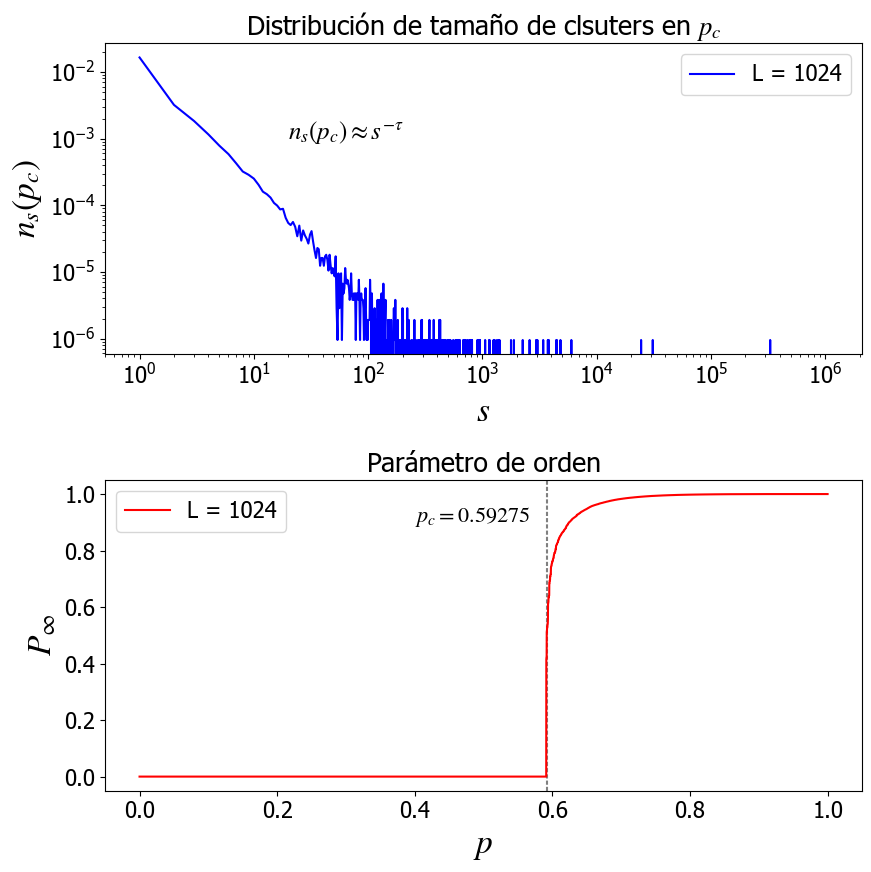

In [41]:
s = np.arange(1,N+1)
p = np.arange(1,N+1)/N

colors = ['b','r','g','m','C0','C1','C2','C3','C4','C5','C6']
fig = plt.figure(figsize = (9,9))

ax2 = fig.add_subplot(2,1,1)
ax2.loglog(s, nspc, color = colors[0],label = "L = {}".format(L))
ax2.set_xlabel(r"$s$",fontsize = 24)
ax2.set_ylabel(r"$n_s(p_c)$",fontsize = 24)
ax2.set_title("Distribución de tamaño de clsuters en $p_c$")
ax2.text(20,0.001,r'$n_s(p_c) \approx s^{-\tau}$',fontsize = 18)
ax2.legend()

ax3 = fig.add_subplot(2,1,2)
ax3.plot(p, PSpan, color = colors[1],label = "L = {}".format(L))
ax3.set_xlabel(r"$p$",fontsize = 24)
ax3.set_ylabel(r"$P_\infty$",fontsize = 24)
ax3.set_title("Parámetro de orden")
ax3.axvline(0.59275,color = "gray",dashes = (2,1),zorder=-1)
ax3.text(0.4,0.9,r'$p_c = 0.59275$')
ax3.legend()

fig.tight_layout()
plt.show()


# 2) Fractales

## El algoritmo de Hammersley, Leath, Alexandrowicz

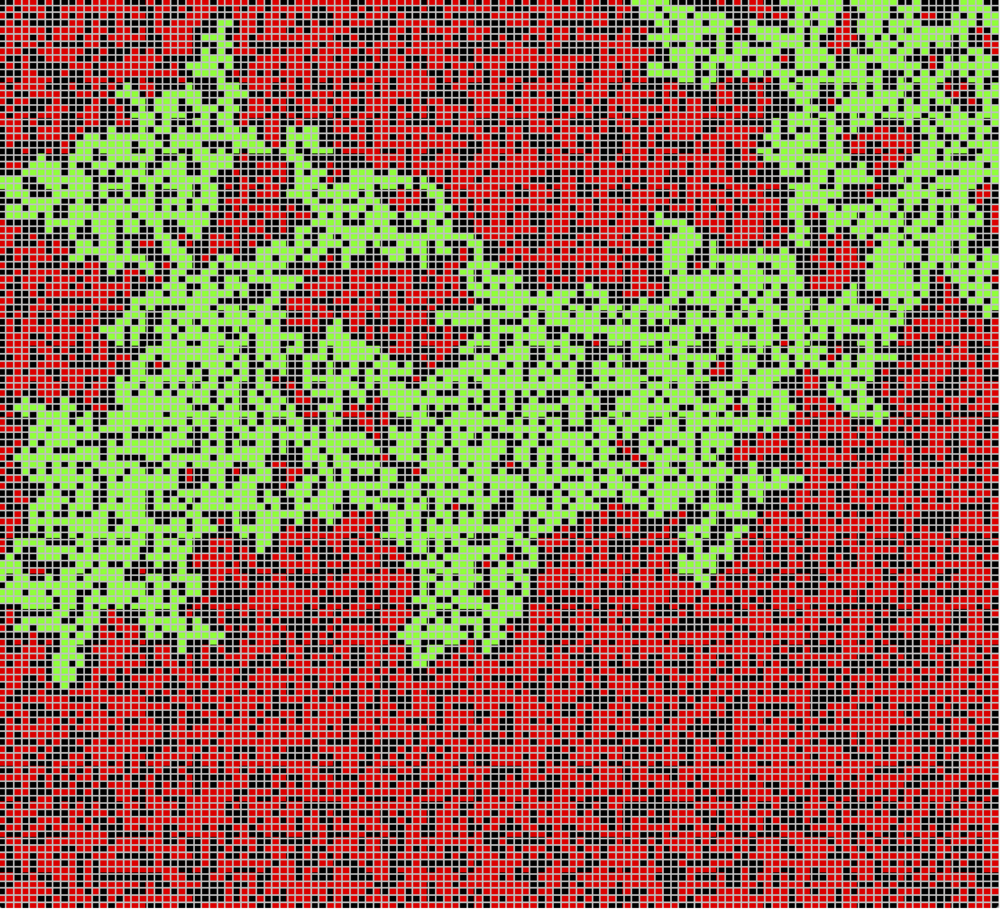

In [42]:
from IPython.display import Image
Image(filename = "aglomeradoperc-3.png",width = 600,height = 600)

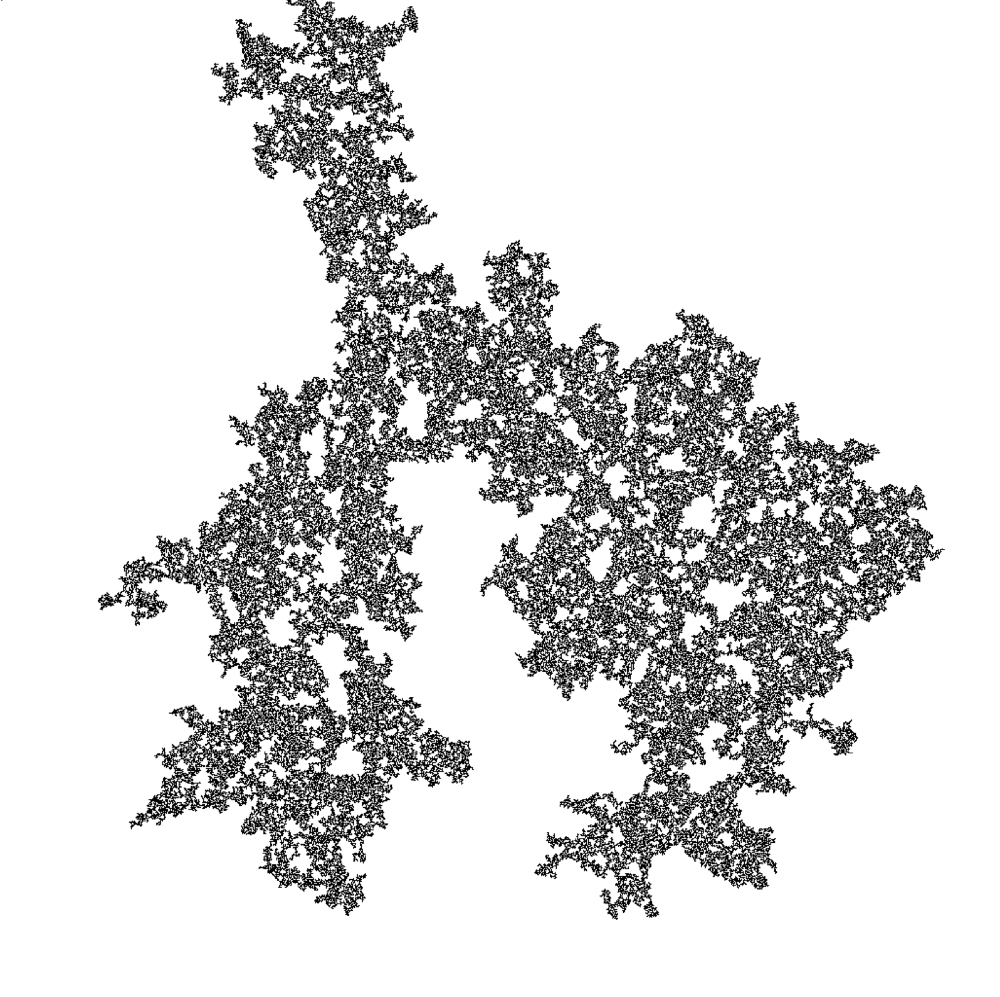

In [43]:
Image(filename = "aglomeradoperc-2.png",width = 600,height = 600)

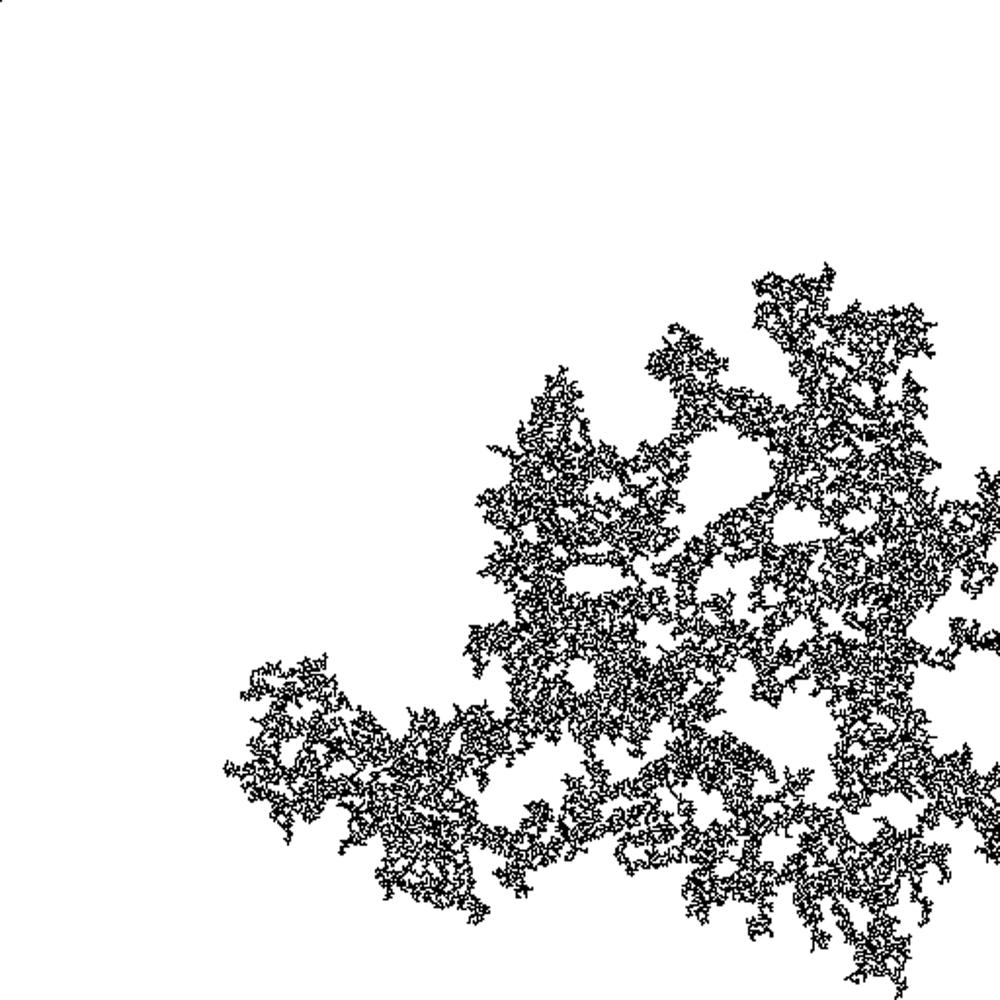

In [44]:
Image(filename = "aglomeradoperc.png",width = 600,height = 600)

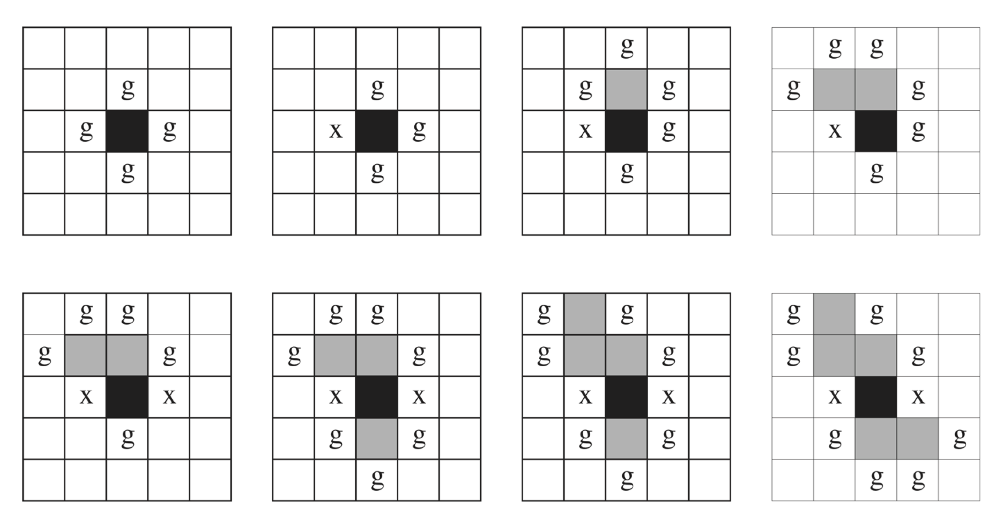

In [45]:
Image(filename = "HLA.png",width = 800,height = 800)

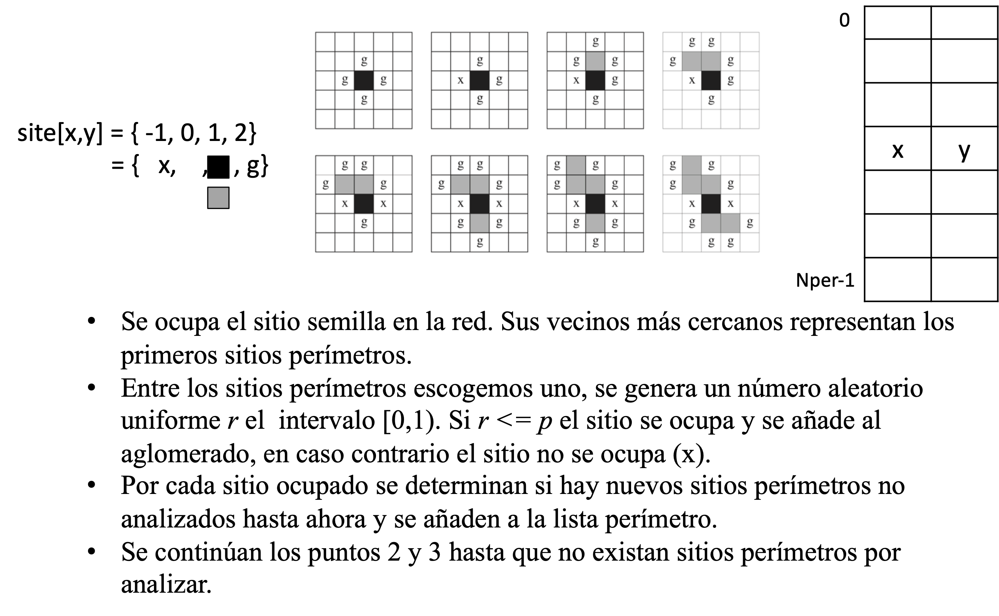

In [46]:
Image(filename = "HLA2.png",width = 800,height = 800)

In [47]:
import numpy.random as nr
import numpy as np
import matplotlib.pyplot as plt

### Algoritmo

Lo ideal es construir uns función llamada HLA con parámetros de entrada $L$ y $p$ y la salida dos arrays con las componentes $x$ y $y$ del cluster

La función tendría las siguiente partes:

1) Inicialización (lo vamos a explicar abajo)

2) Loop (Se debe repetir mientras el perímetro tenga longitud distinta de cero)

* Se escogen un sitio del perímetro, dicho sitio se debe eliminar del perímetro (sugerencia abajo)

* Se lanza un número al azar. Si es menor que $p$ site 2 $\rightarrow$  1 y el sitio se agrega al cluster. Se examinan los vecinos de ese sitio si todavía no han sido tocados (site = 0) se agregan al perímetro site 0 $\rightarrow$ 2(es decir el perímetro crece)

* Si el número al azar no es menor que $p$. site 2 $\rightarrow$  -1

3) La salida debe ser xCluster y yCluster

### 1) Primera posibilidad

In [48]:
L = 6 
p =0.59275

#def HLA(L,p)
N = L*L
site = np.zeros((L+2,L+2),dtype = np.short)
# -1 significa sitio vacio, 0 sitio por preguntar, 1 sitio lleno, 2 perimetro
perx = np.array([],dtype = int)
pery = np.array([],dtype = int)

#Las paredes dentro de site
for i in range(L+2): #bordes
    site[0,i] = -1
    site[i,0] = -1
    site[L+1,i] = -1
    site[i,L+1] = -1


#desplazamiento a vecinos
nx = np.array([1,0,-1,0])
ny = np.array([0,1,0,-1])

#Sitio inicial
xseed = L//2
yseed = L//2
site[yseed,xseed] = 1
xCluster = np.array([xseed])
yCluster = np.array([yseed])
Ncluster = 1   #numero de sitios pertenecientes al cluster

#Generación del primer perimetro
for i in range(4):
    newperx = xseed + nx[i]
    newpery = yseed + ny[i]
    perx = np.append(perx,newperx)
    pery = np.append(pery,newpery)
    site[newperx,newpery] = 2

Nper = 4 #numero de elementos del perimetro



# return xCluster-1, yCluster-1

In [49]:
print(perx,pery)

[4 3 2 3] [3 4 3 2]


In [50]:
print(site)

[[-1 -1 -1 -1 -1 -1 -1 -1]
 [-1  0  0  0  0  0  0 -1]
 [-1  0  0  2  0  0  0 -1]
 [-1  0  2  1  2  0  0 -1]
 [-1  0  0  2  0  0  0 -1]
 [-1  0  0  0  0  0  0 -1]
 [-1  0  0  0  0  0  0 -1]
 [-1 -1 -1 -1 -1 -1 -1 -1]]


In [51]:
print(xseed,yseed)

3 3


**¿Cómo escogemos un sitio del perímetro?**

**Podríamos escoger el último:**

indice = Nper-1

xnew = perx[indice]

...................

perx = np.delete(perx,indice)

...................

recordar reducir Nper

**O escogemos uno al azar:** para evitar posible bias

indice = nr.randint(Nper)

xnew = perx[indice]

...................

perx = np.delete(perx,indice)

...................

recordar reducir Nper

**¿Cómo agregamos un sitio al perímetro?**

perx = np.append(perx,newperx)

..............................

recordar aumentar Nper

### 2) Segunda posibilidad

In [52]:
# Setting the boundaries no PBC utilizando case, no hay vecino EMPTY
def vecino(s,j):
    global L,empty
    
    if j == 2: #izquierda
        if s%L ==0:
            return empty
        else:
            return s-1
    elif j==0: #derecha
        if s%L == L-1:
            return empty
        else:
            return s+1
    elif j==3: #abajo
        if s//L == 0:
            return empty
        else:
            return s-L
    elif j==1: #arriba
        if s//L == L-1:
            return empty
        else:
            return s+L
                
def boundaries():
    global N,nn
    for s in range(N):
        for j in range(4):
            nn[s,j] = vecino(s,j)

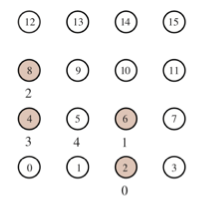

In [53]:
Image("EsquemaNZ.png", width=300, height=300)

Comprobación:

In [54]:
global nn, empty, N,L
L=4
N = L*L
site = np.zeros(N,dtype = np.short) #inicialización
# Vecinos y boundaries del algoritmo se Newman Ziff
empty = -1
nn=np.zeros((N, 4), dtype=int) 
boundaries()

In [55]:
nn[3]

array([-1,  7,  2, -1])

In [56]:
global nn, empty, N,L
L = 4 
N = L*L
p =0.59275
site = np.zeros(N,dtype = np.short) #inicialización
# -1 significa sitio vacio, 0 sitio por preguntar, 1 sitio lleno, 2 perimetro
empty = -1
nn=np.zeros((N, 4), dtype=int) 
boundaries()
per = np.array([],dtype = int)

#Sitio inicial
sseed = (L+1)*L//2
sCluster = np.array([sseed])

site[sseed] = 1
Ncluster = 1   #numero de sitios pertenecientes al cluster

#Generación del primer perimetro
for j in range(4):
    newper = nn[sseed,j]
    per = np.append(per,newper)
    site[newper] = 2

Nper = 4 #numero de elementos del perimetro

In [57]:
for i in range(N):
    if i%L == 0:
        print('\n')
    print(site[i],end = ' ')



0 0 0 0 

0 0 2 0 

0 2 1 2 

0 0 2 0 

In [58]:
 print(per)

[11 14  9  6]


¿Cómo escogemos un sitio del perímetro?

**Podríamos escoger el último:**

snew = site[per[Nper-1]]

per = np.delete(per,Nper-1)

**O escogemos uno al azar:** para evitar posible bias

index = nr.randint(Nper)

snew = site[per[index]]

per = np.delete(per,index)

## Dimensión fractal

In [59]:
import numpy as np
import matplotlib.pyplot as plt

In [60]:
plt.rcParams['font.size'] = '16'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Tahoma']
#plt.rc('text',usetex = True)
plt.rc('mathtext', fontset='stix')


Almacenados hay cluster para tamaños $L = 256, 512,2048$

In [61]:
L = 256

In [62]:
xCluster, yCluster = np.loadtxt('Cluster-clase-{}.txt'.format(L),unpack  = True)

**Para visualizar**

(0.0, 256.0)

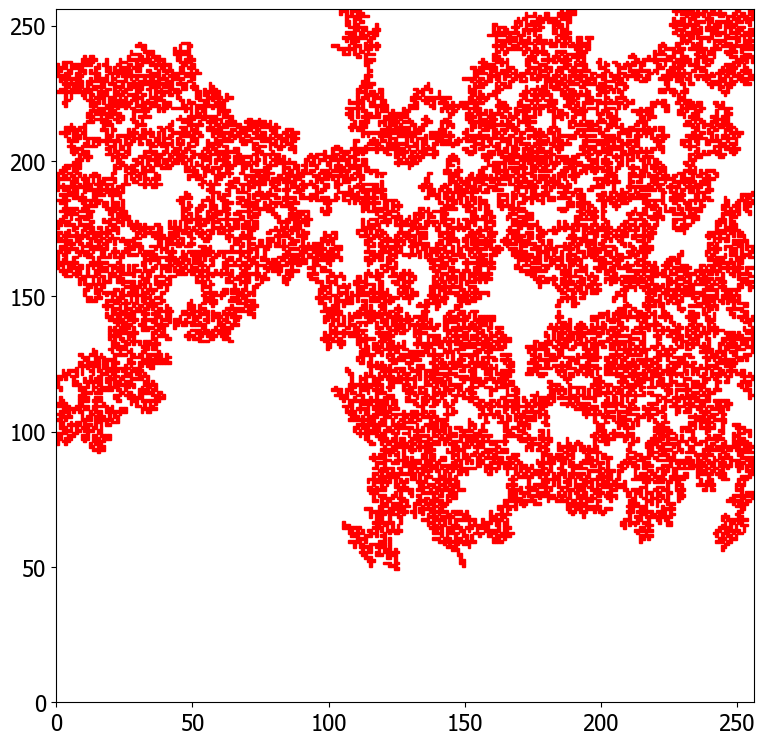

In [63]:
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1,1,1)
for i in range(xCluster.size):
    rect = plt.Rectangle((xCluster[i], yCluster[i]), 1, 1, color='r')
    ax.add_patch(rect)    
#plt.plot(xcluster,ycluster,'b.')
plt.xlim(0,L)
plt.ylim(0,L)

In [64]:
def MassDist(L,xCluster,yCluster):
    Ncluster = xCluster.size
    #Claculo del centro de masas
    xcm = xCluster[:Ncluster].mean()
    ycm = yCluster[:Ncluster].mean()
    dx = xCluster[:Ncluster] - xcm
    dy = yCluster[:Ncluster] - ycm
    dr = np.sqrt(dx*dx + dy*dy)
    massinside = []
    r = []
    imax=int(np.log2(L))
    for i in range(1,imax):
        massinside.append(dr[dr<(2**i)].size)
        r.append(2**i)
    return np.array(r),np.array(massinside)

In [65]:
r, M = MassDist(L,xCluster,yCluster)

\begin{equation}
M = A\,r^{D_f}
\end{equation}

In [66]:
def lineFit(x, y):
    xavg = x.mean()
    slope = (y * (x - xavg)).sum() / (x * (x - xavg)).sum()
    yint = y.mean() - slope * xavg
    return slope, yint

In [67]:
slope, corte = lineFit(np.log(r),np.log(M))
error = np.abs((slope-1.89)/1.89)*100

In [68]:
print('dimension fractal = {}, error = {} %'.format(round(slope,2),round(error,1)))

dimension fractal = 1.82, error = 3.9 %


Text(2, 15023.7, '$d_f =$ 1.82')

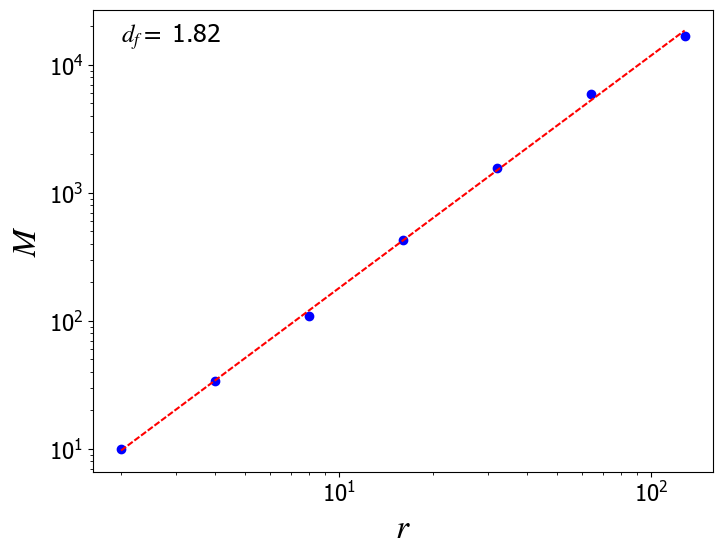

In [69]:
plt.figure(figsize=(8,6))
plt.loglog(r,M,'bo')
plt.plot(r,np.exp(corte)*r**slope,color = 'red',dashes = (3,1))
plt.xlabel(r'$r$',fontsize = 24)
plt.ylabel(r'$M$',fontsize = 24)
plt.text(r.min(),0.9*M.max(),r'$d_f =$ {}'.format(round(slope,2)),fontsize = 18)

In [70]:
L = 512

In [71]:
xCluster, yCluster = np.loadtxt('Cluster-clase-{}.txt'.format(L),unpack  = True)

In [72]:
r, M = MassDist(L,xCluster,yCluster)

In [73]:
slope, corte = lineFit(np.log(r),np.log(M))
error = np.abs((slope-1.89)/1.89)*100

In [74]:
print('dimension fractal = {}, error = {} %'.format(round(slope,2),round(error,1)))

dimension fractal = 1.91, error = 1.0 %


Text(2, 76331.7, '$d_f =$ 1.91')

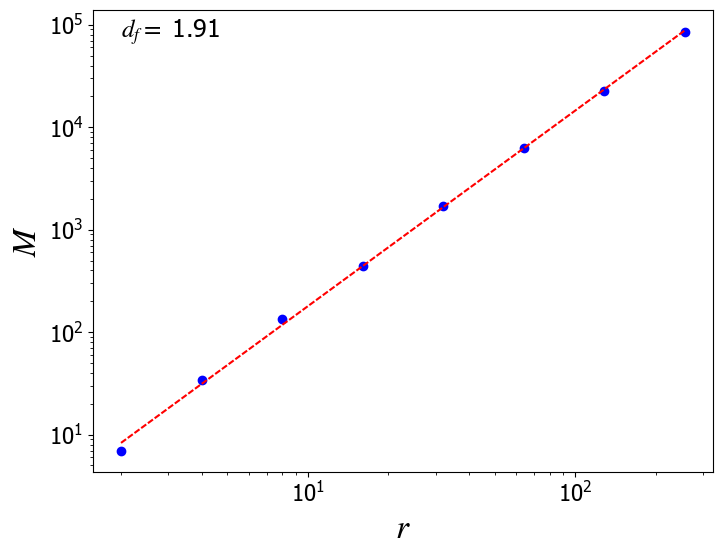

In [75]:
plt.figure(figsize=(8,6))
plt.loglog(r,M,'bo')
plt.plot(r,np.exp(corte)*r**slope,color = 'red',dashes = (3,1))
plt.xlabel(r'$r$',fontsize = 24)
plt.ylabel(r'$M$',fontsize = 24)
plt.text(r.min(),0.9*M.max(),r'$d_f =$ {}'.format(round(slope,2)),fontsize = 18)

In [76]:
L = 2048

In [77]:
xCluster, yCluster = np.loadtxt('Cluster-clase-{}.txt'.format(L),unpack  = True)

In [78]:
r, M = MassDist(L,xCluster,yCluster)

In [79]:
slope, corte = lineFit(np.log(r),np.log(M))
error = np.abs((slope-1.89)/1.89)*100

In [80]:
print('dimension fractal = {}, error = {} %'.format(round(slope,2),round(error,1)))

dimension fractal = 1.92, error = 1.6 %


In [81]:
plt.rcParams['font.size'] = '16'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Tahoma']
#plt.rc('text',usetex = True)
plt.rc('mathtext', fontset='stix')


Text(2, 465276.60000000003, '$d_f =$ 1.92')

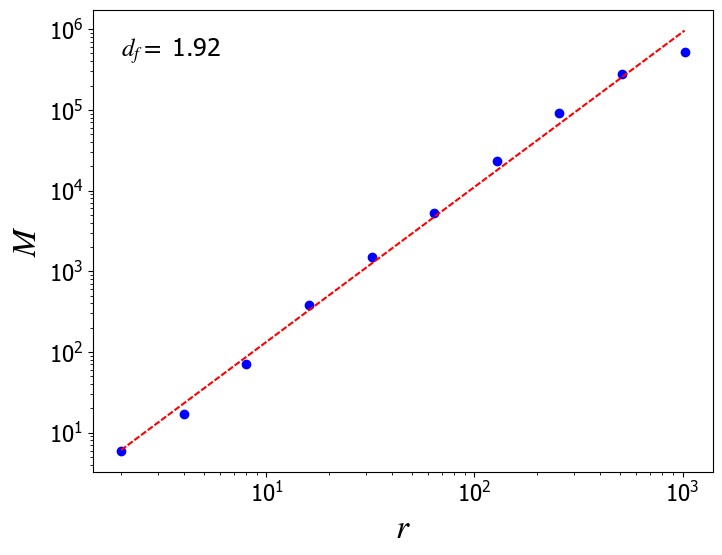

In [82]:
plt.figure(figsize=(8,6))
plt.loglog(r,M,'bo')
plt.plot(r,np.exp(corte)*r**slope,color = 'red',dashes = (3,1))
plt.xlabel(r'$r$',fontsize = 24)
plt.ylabel(r'$M$',fontsize = 24)
plt.text(r.min(),0.9*M.max(),r'$d_f =$ {}'.format(round(slope,2)),fontsize = 18)

**¿Cómo escoger una tamaño promedio de cluster***

\begin{equation}
\frac{M}{p_c\,N}=P_\infty(p_c,L) = A L^{-\beta/\nu}
\end{equation}

Por lo tanto un valor de $M$ típico sería:

\begin{equation}
M = A L^{-\beta/\nu} N  p_c = Ap_c L^{2-\beta/\nu}
\end{equation}

Del laboratorio anterior: 

\begin{equation}
\frac{\beta}{\nu} = 0.1,\; A = 0.45,\; p_c = 0.59275 
\end{equation}

In [83]:
L = 256
M = int(0.45*0.59275*L**(2-0.1))
print(M)

10040


In [84]:
L = 512
M = int(0.45*0.59275*L**(2-0.1))
print(M)

37471


In [85]:
L = 2048
M = int(0.45*0.59275*L**(2-0.1))
print(M)

521928


### Implementación del algoritmo de cajitas

In [86]:
L = 256
xCluster, yCluster = np.loadtxt('Cluster-clase-{}.txt'.format(L),unpack  = True)

Text(24, 48, '$l$')

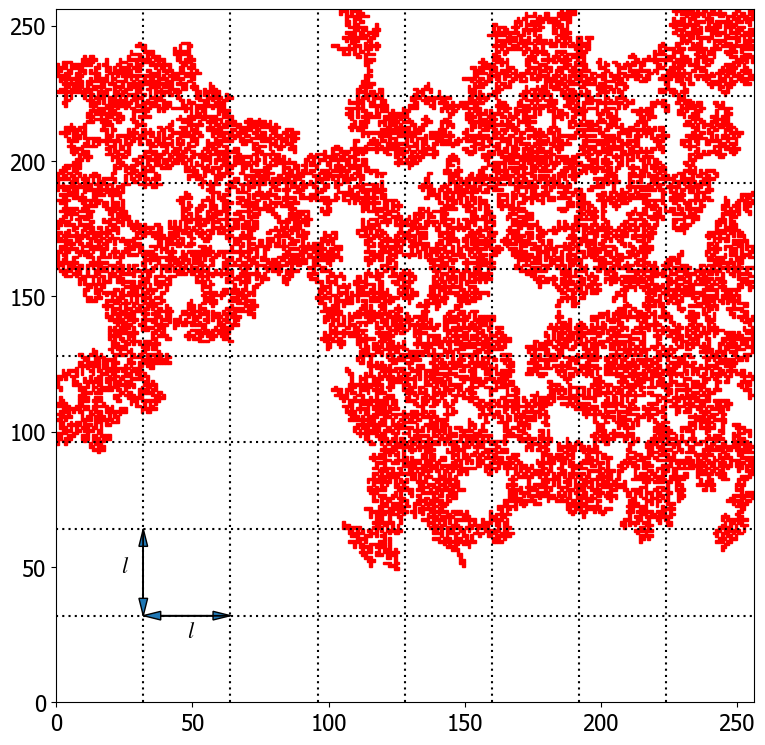

In [87]:
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1,1,1)
for i in range(xCluster.size):
    rect = plt.Rectangle((xCluster[i], yCluster[i]), 1, 1, color='r')
    ax.add_patch(rect)    
#plt.plot(xcluster,ycluster,'b.')
plt.xlim(0,L)
plt.ylim(0,L)
for i in range(2**5,L,2**5):
    ax.axhline(i,color='black',dashes=(1, 2),zorder=1)
    ax.axvline(i,color='black',dashes=(1, 2),zorder=1)
    
plt.arrow(32, 32, 0, 32,head_width=3.2, head_length=6.4,length_includes_head = True)
plt.arrow(32, 64, 0, -32,head_width=3.2, head_length=6.4,length_includes_head = True)
plt.arrow(32, 32, 32, 0,head_width=3.2, head_length=6.4,length_includes_head = True)
plt.arrow(64, 32, -32, 0,head_width=3.2, head_length=6.4,length_includes_head = True)
plt.text(48,24,r'$l$',fontsize = 16)
plt.text(24,48,r'$l$',fontsize = 16)

La idea del algoritmo de cajitas es ir subdividiendo el sistema en cajitas de longitud $l$. Para este caso nuestro sistema quedaría subdividido en $n_l\times n_l$ cajitas, donde $n_l$ es el número de cajitas por lado.

Una vez subdividido el sistema hay dos posibilidades (puede hacer el que usted quiera):

1) Se cuentan el número de cajitas ocupadas.

2) Se promedia la masa de las cajitas ocupadas (se excluyen las vacías en el promedio)

Esto se hace para varios valores de $l$. 

Dos sugerencias:

1) Para cada $l$ conviene hacer los promedios o el conteo  en un array parcial de dimensiones $n_l\times n_l$

2) Luego recorrer los puntos de los arreglos xCluster y yCluster y ver a que cajita pertenecen. Pata ello usted hace las siguientes operaciones:
* int(xCluster//l)
* int(yCluster//l)

Al final usted obtendrá dependiendo del camino que usted utilice estas leyes de escalamiento:

\begin{equation}
M = A\,l^{d_f} \qquad \mbox{o} \qquad N = B\,l^{-d_f}
\end{equation}

donde $M$ es la masa promedio en cajitas de longitud $l$ y $N$ es el número de cajitas ocupadas de longitud $l$

Podría usar el método de numpy llamado np.unique

## Fractales regulares

## Sierpinski Gasket
### Algoritmo recursivo utilizando matplotlib

¿Cómo hacemos un algoritmo recursivo para pintar la imagen de un fractal regular utilizando matplotlib?

En cada paso cada parte del objeto similar al iniciador es sustituido por el generador

In [88]:
#os.chdir(dirbase)
from IPython.display import Image
Image(filename = "SierpinskiGasket-algo1.png",width = 600,height = 300)

FileNotFoundError: [Errno 2] No such file or directory: 'SierpinskiGasket-algo1.png'

En matplolib hay funciones que dibujan formas geométricas. Para este caso debemos dibujar triangulos. Para dibujarlos, como son triangulos equiláteros y en cada paso el lado del triángulo es la mitad que en el paso anterior, basta conocer el vértice inferior izquierdo de cada nuevo triangulo.

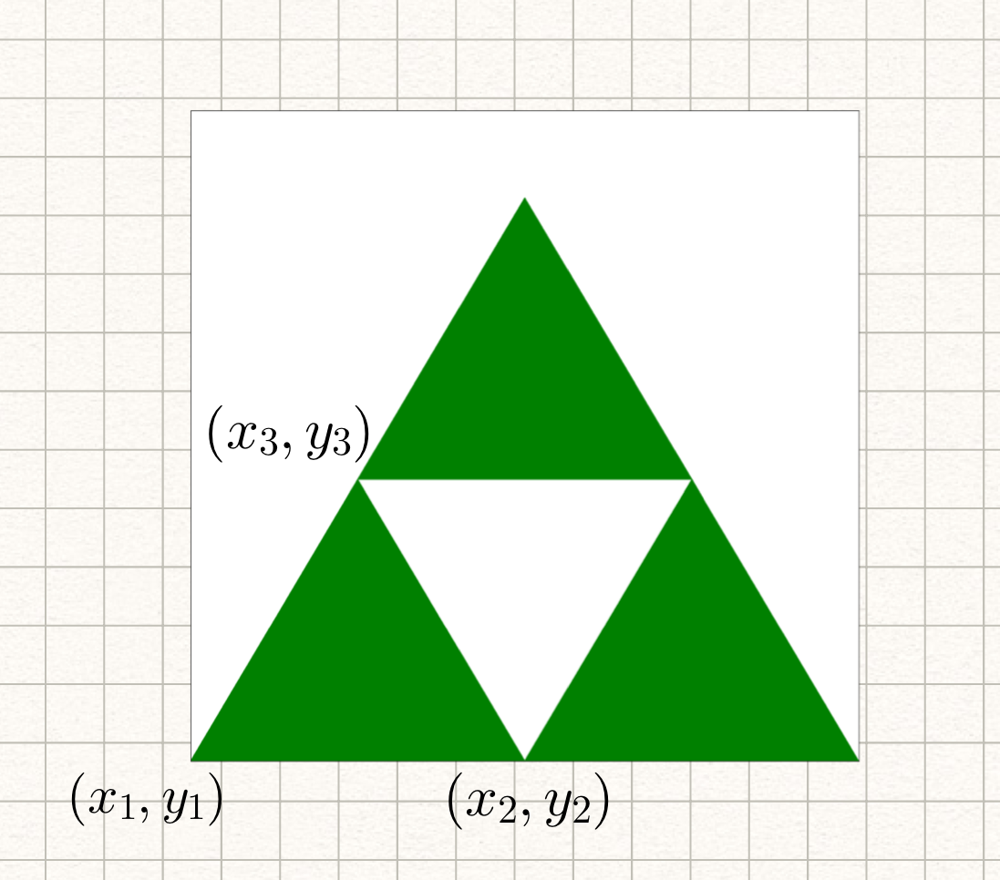

In [ ]:
from IPython.display import Image
Image(filename = "SierpinskiGasket-algo2.png",width = 300,height = 300)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def SierpinskiGasket(x1,y1,L,n):
    '''
        x1,y1: coordenadas del vertice izquierdo L: longitud del triangulo a subdividir 
        n: número de interaciones
    '''
    if n>0:
        x2 = x1 + L/2
        y2 = y1
        x3 = x1 + L/4
        y3 = y1 + np.sqrt(3)*L/4

        SierpinskiGasket(x1,y1,L/2,n-1)
        SierpinskiGasket(x2,y2,L/2,n-1)
        SierpinskiGasket(x3,y3,L/2,n-1)
    else:
        triangulo = plt.Polygon([[x1, y1], [x1+L, y1], [x1+L/2, y1+np.sqrt(3)*L/2]],color='g')
        ax.add_patch(triangulo)

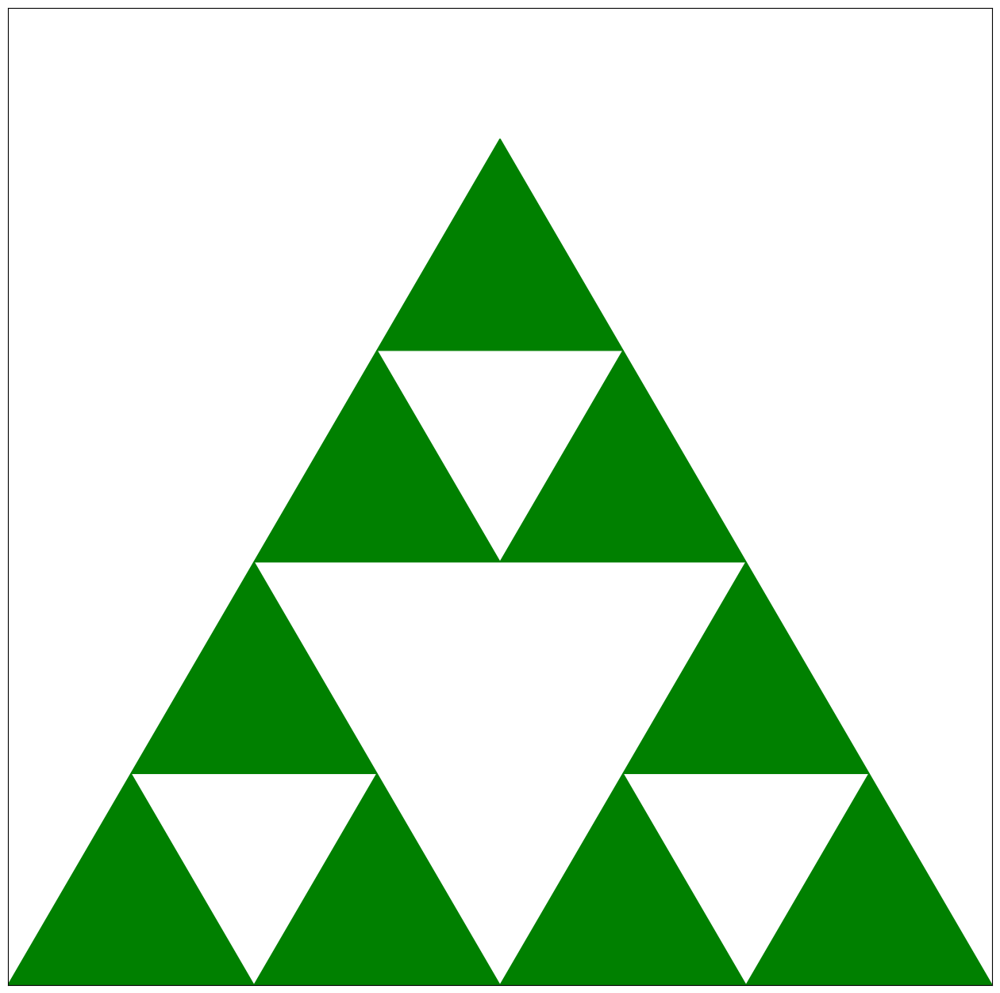

In [ ]:
fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim(0,600)
ax.set_ylim(0,600)
ax.set_xticks([])
ax.set_yticks([])
r = 2
SierpinskiGasket(0,0,600,r)
fig.savefig("SierpinskiGasket"+str(r)+".png")
plt.show()

### Dimensión fractal

\begin{eqnarray}
L &=& 2^i\, l\\
M &=& 3^i\, m,
\end{eqnarray}

donde $i$ es el orden de la generación, $l$ y $m$ son el lado y la masa de cada triangulo en la generación $i$.

Calculando logaritmos tenemos:

\begin{eqnarray}
\log(L) &=& i\log(2)+ log(l)\\
\log(M) &=& i\log(3)+ log(m)
\end{eqnarray}

Eliminando $i$ tenemos finalemente:

\begin{equation}
\frac{M}{m} = \left ( \frac{L}{l} \right )^{D_f},
\end{equation}

donde la dimensión fractal

\begin{equation}
\boxed{D_f = \frac{\log 3}{\log 2}}
\end{equation}

In [ ]:
from IPython.display import display, Math
print('Dimensión fractal, ',end = ' ')
display(Math(r'D_f = {} < 2'.format(round(np.log(3)/np.log(2),3))))

Dimensión fractal,  

<IPython.core.display.Math object>

## La curva de Koch
### Algoritmo recursivo utilizando matplotlib para visualizar

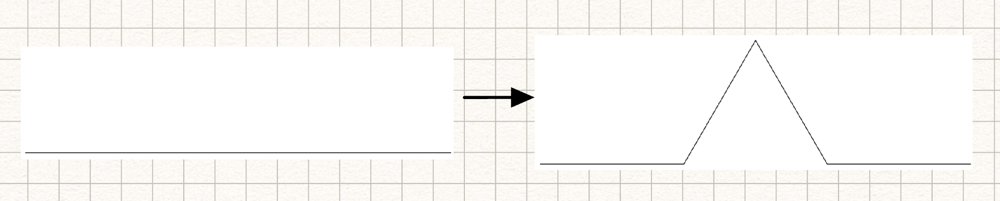

In [ ]:
#os.chdir(dirbase)
from IPython.display import Image
Image(filename = "Koch-algo1.png",width = 600,height = 300)

Cada línea se transforma en el generador

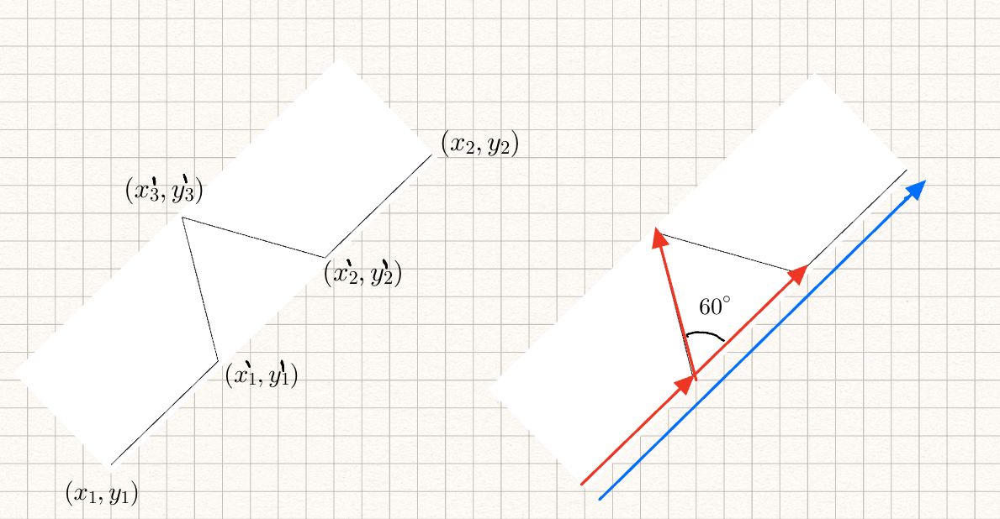

In [ ]:
from IPython.display import Image
Image(filename = "Koch-algo2.png",width = 600,height = 300)

En cada paso entran a la función los puntos extremos de la línea inical, $P_1 = (x_1,y_1)$ y $P_2 = (x_2,y_2)$. En dicha función hay que conseguir los puntos $P^\prime_1 = (x^\prime_1,y^\prime_1)$, $P^\prime_2 = (x^\prime_2,y^\prime_2)$ y $P^\prime_3 = (x^\prime_3,y^\prime_3)$ para pintar en matplotlib las líneas entre los diferentes puntos.

El vector que se encuentra ente $P_1$ y $P_2$ (vecor azul) tiene como componentes $dx = x_2-x_1$ y $dy = y_2-y_1$ 

Por lo tanto los vectores rojos parlelos al azul apuntaran a los puntos:
\begin{eqnarray}
P^\prime_1 = (x^\prime_1,y^\prime_1) &=& \left (x_1+\frac{dx}{3},y_1+\frac{dy}{3}  \right )\\
P^\prime_2 = (x^\prime_2,y^\prime_2) &=& \left (x_1+\frac{2dx}{3},y_1+\frac{2dy}{3}  \right )
\end{eqnarray}

Nótese que el vector rojo que va de $P^\prime_2$ a $P^\prime_3$ es la rotación de $60^\circ$ del vector que va de $P^\prime_1$ a $P^\prime_2$.

\begin{equation}
P^\prime_3 = \left ( x_3^\prime \atop y_3^\prime \right ) = \left ( x_1^\prime \atop y_1^\prime \right ) + \left (\begin{array}{rr}\cos 60^\circ & -\sin 60^\circ \\ \sin 60^\circ & \cos 60^\circ \end{array} \right )\left (dx/3 \atop dy/3 \right )
\end{equation}

Por lo tanto el punto $P^\prime_3$ se encontrará en:

\begin{eqnarray}
x_3^\prime &=& x_1^\prime + \frac{dx}{6}-\frac{\sqrt{3}dy}{6}\\
y_3^\prime &=& y_1^\prime + \frac{dy}{6}+\frac{\sqrt{3}dx}{6}
\end{eqnarray}

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def curvaKoch(x1,y1,x2,y2,n):
    '''
        x1,y1: punto izquierdo de la línea a subdividir
        x2,y2: punto derecho de la líne a subdividir
        n: número de interaciones
    '''
    if n>0:
        dx = (x2-x1)
        dy = (y2-y1)
        x1p = x1+dx/3
        y1p = y1+dy/3
        x2p = x1+2*dx/3
        y2p = y1+2*dy/3
        x3p = x1p + dx/6 - np.sqrt(3)*dy/6
        y3p = y1p + dy/6 + np.sqrt(3)*dx/6
        
        curvaKoch(x1,y1,x1p,y1p,n-1)
        curvaKoch(x1p,y1p,x3p,y3p,n-1)
        curvaKoch(x3p,y3p,x2p,y2p,n-1)
        curvaKoch(x2p,y2p,x2,y2,n-1)
    else:
        plt.plot([x1,x2],[y1,y2],'b',linewidth=2.0)


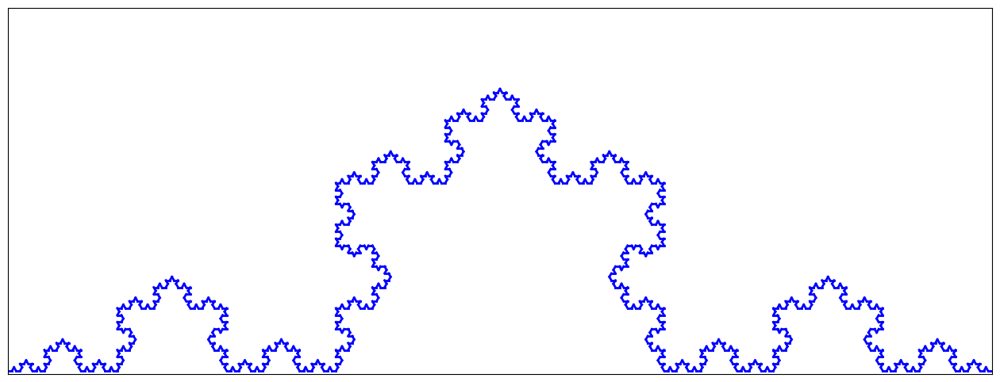

In [ ]:
fig = plt.figure(figsize=(16,6))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim(-300,300)
ax.set_ylim(-2,300*3/4-2)
ax.set_xticks([])
ax.set_yticks([])
r = 5
curvaKoch(-300,0,300,0,r)
plt.savefig('KochGenerador.png')